In [1]:
def plot_image(xr_image, x="x", y="y", size=10):
    rgb = xr_image.to_array(dim="color")
    rgb = rgb.transpose(*(rgb.dims[1:] + rgb.dims[:1]))
    rgb = rgb / 255
    rgb.plot.imshow(x=x, y=y, size=size)
    

In [2]:
from datacube import Datacube
dc = Datacube()
data = dc.load(
    product='ls8_nbart_geomedian_annual',
    measurements=['red', 'green', 'blue'],
    latitude=(-16.1144, -13.4938),
    longitude=(140.7184, 145.6924),
    time=('2019-01', '2019-01'),
    output_crs="EPSG:3577",
    resolution=(-300,300)
)

/home/jovyan/.envs/odc/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [3]:
rgb_cfg = {
    "components": {
        "red": {"red": 1.0},        # Linear compenents
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),   #  Dynamic Range Scaling
}

In [4]:
from datacube_ows.styles.api import apply_ows_style_cfg
xr_image = apply_ows_style_cfg(rgb_cfg, data)

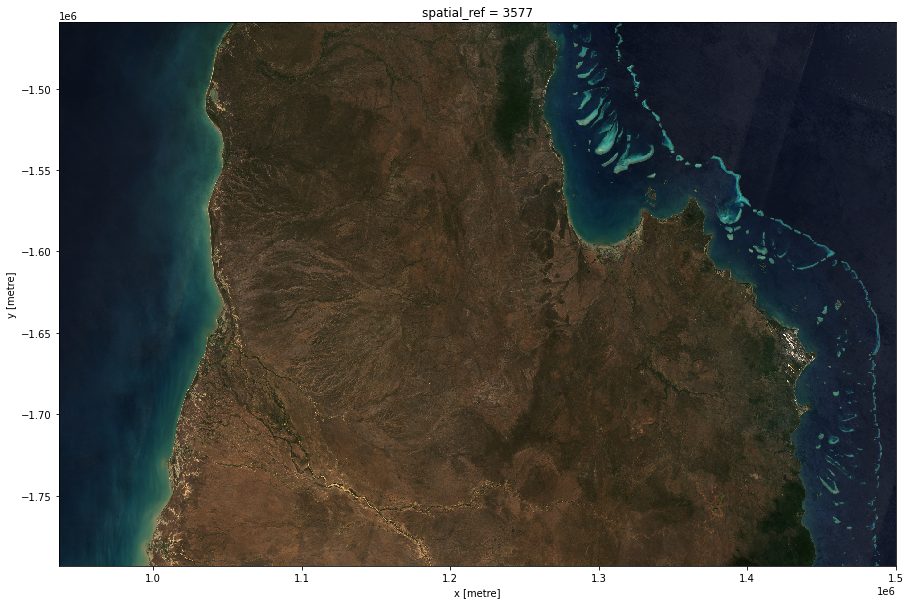

In [5]:
plot_image(xr_image)


In [6]:
from datacube import Datacube
dc = Datacube()
data = dc.load(
    product='ls8_nbart_geomedian_annual',
    measurements=['red', 'green', 'blue', 'nir', 'swir1', 'swir2'],
    latitude=(-16.1144, -13.4938),
    longitude=(140.7184, 145.6924),
    time=('2019-01', '2019-01'),
    output_crs="EPSG:3577",
    resolution=(-300,300)
)

/home/jovyan/.envs/odc/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [7]:
data

<xarray.Dataset>
Dimensions:      (time: 1, x: 1879, y: 1113)
Coordinates:
  * time         (time) datetime64[ns] 2019-01-01
  * y            (y) float64 -1.459e+06 -1.46e+06 ... -1.793e+06 -1.793e+06
  * x            (x) float64 9.368e+05 9.370e+05 9.374e+05 ... 1.5e+06 1.5e+06
    spatial_ref  int32 3577
Data variables:
    red          (time, y, x) int16 187 186 191 199 200 ... 268 242 271 290 261
    green        (time, y, x) int16 260 263 265 273 275 ... 325 300 327 346 318
    blue         (time, y, x) int16 399 399 402 407 410 ... 520 494 517 538 511
    nir          (time, y, x) int16 174 172 177 186 187 ... 250 225 256 275 243
    swir1        (time, y, x) int16 137 134 140 149 147 ... 203 184 215 232 202
    swir2        (time, y, x) int16 111 109 113 119 120 ... 170 152 180 195 168
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

In [8]:
ir_green_cfg = {
    "components": {
        "red": {
            "swir1": 1.0
        },
        "green": {
            "nir": 1.0
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (50, 3000),
}



In [9]:
xr_image_irg = apply_ows_style_cfg(ir_green_cfg, data)

In [10]:
xr_image_rgb = apply_ows_style_cfg(rgb_cfg, data)

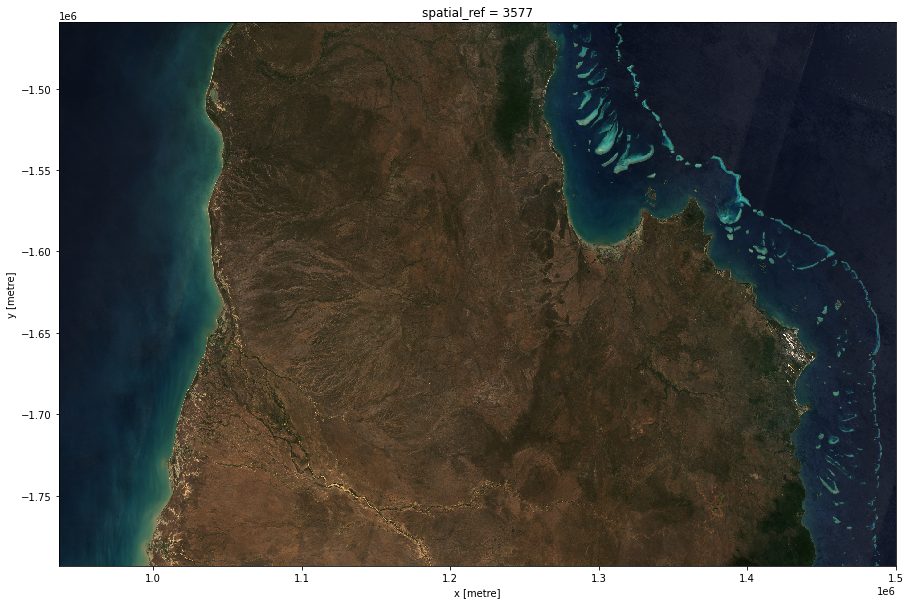

In [11]:
plot_image(xr_image_rgb)

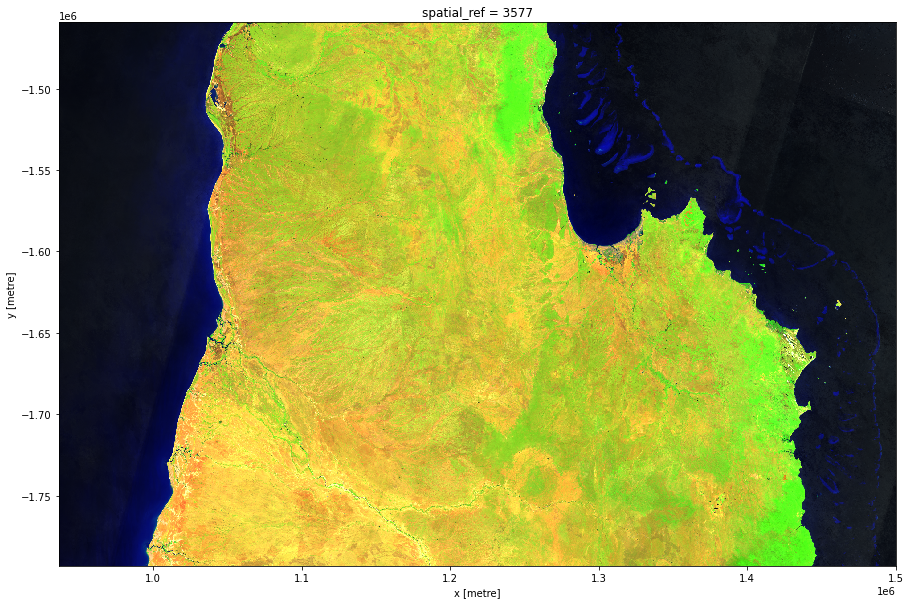

In [12]:
plot_image(xr_image_irg)

In [13]:
irg_bandscale_cfg = {
    "components": {
        "red": {
            "swir1": 1.0,
            "scale_range": (1500, 3700),
        },
        "green": {
            "nir": 1.0,
            "scale_range": (1600, 3200),
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (200, 1900),
}


In [14]:
xr_bandscale = apply_ows_style_cfg(irg_bandscale_cfg, data)


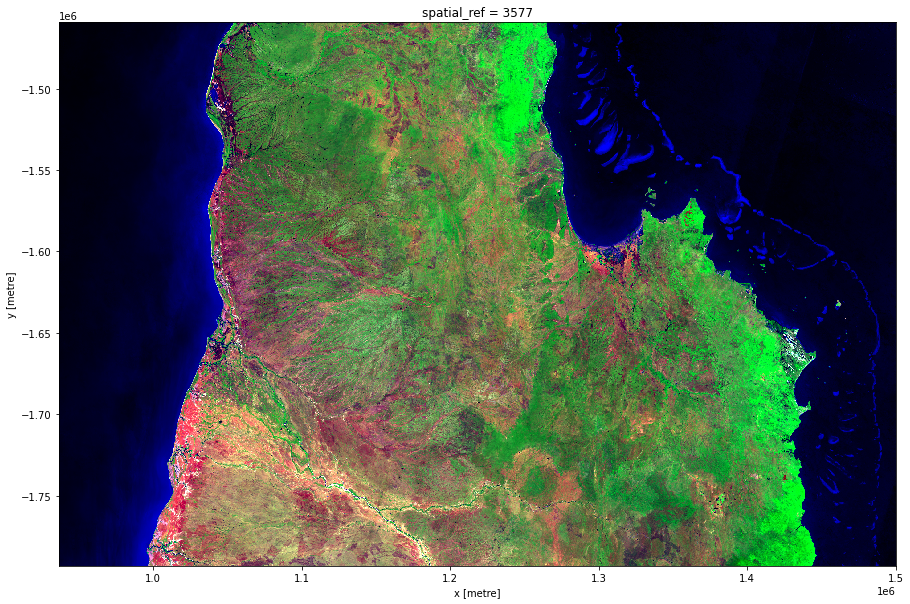

In [15]:
plot_image(xr_bandscale)

In [16]:
def ndvi(data):
    # Returns data in range (-1, 1)
    return (data["nir"] - data["red"]) / (data["nir"] + data["red")

SyntaxError: invalid syntax (<ipython-input-16-3fecc5b05e53>, line 3)

In [17]:
def ndvi(data):
    # Returns data in range (-1, 1)
    return (data["nir"] - data["red"]) / (data["nir"] + data["red"])

In [19]:
rgb_ndvi_cfg = {
     "components": {
        "red": {"red": 1.0},        # Linear compenents
        "green": ndvi,
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),   #  Dynamic Range Scaling
}

In [20]:
xr_rgb_ndvi = apply_ows_style_cfg(rgb_ndvi_cfg, data)


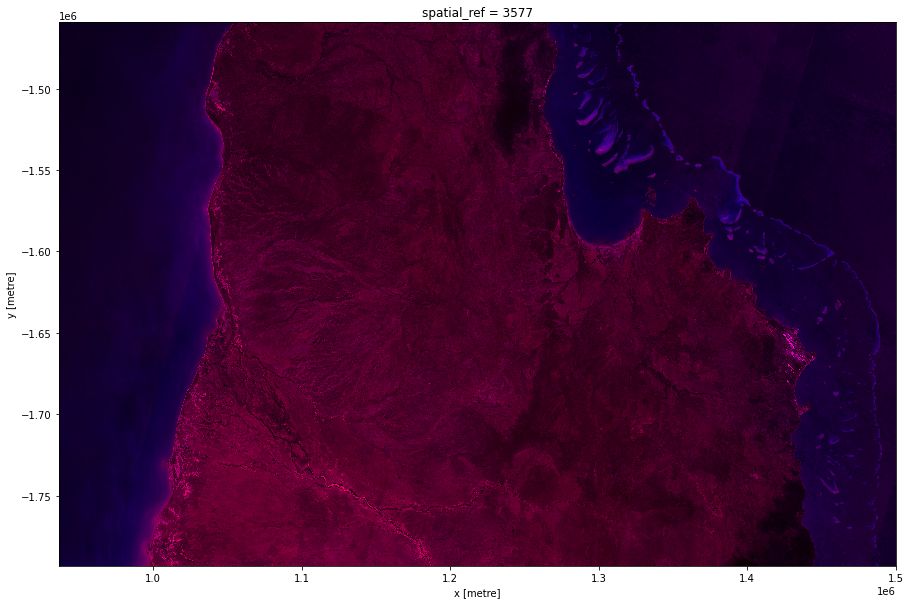

In [21]:
plot_image(xr_rgb_ndvi)

In [23]:
def ndvi(data):
    # Calculate NDVI (-1.0 to 1.0)
    unscaled = (data["nir"] - data["red"])/(data["nir"] + data["red"])

    # Scale to [-1.0 - 1.0] to [0 - 255]
    scaled = ((unscaled + 1.0) * 255/2).clip(0, 255)

    return scaled

r_ndvi_b_fullrange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": ndvi,
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),
}

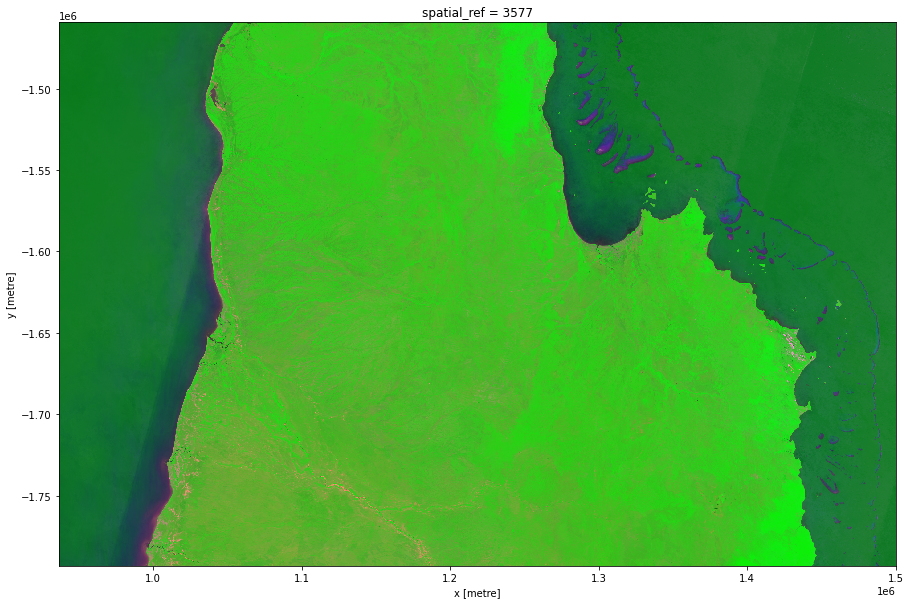

In [24]:
xr_rgn_ndvi_fullrange = apply_ows_style_cfg(r_ndvi_b_fullrange_cfg, data)
plot_image(xr_rgn_ndvi_fullrange)

In [25]:
from datacube_ows.styles.api import scalable

@scalable
def scaled_ndvi(data):
    # Calculate NDVI (-1.0 to 1.0)
    return (data["nir"] - data["red"])/(data["nir"] + data["red"])

In [26]:
r_ndvi_b_halfrange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {
            "function": scaled_ndvi,
            # In addition to the standard API calling argument (the input data),
            # additional positional or keyword arguments can
            # be passed to the function using an args array and/or a kwargs dictionary.
            "kwargs": {
                "scale_from": (0.0, 1.0),
                "scale_to": (0, 255)
            }
        },
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),
}


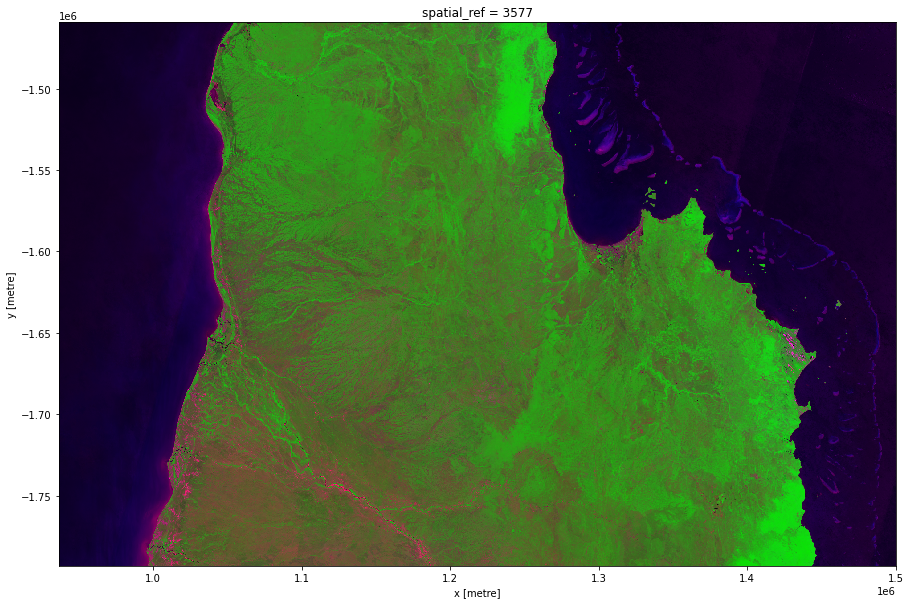

In [27]:
plot_image(apply_ows_style_cfg(r_ndvi_b_halfrange_cfg, data))

In [28]:
r_ndvi_ndwi_halfrange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "nir",
                "band2": "red",
                "scale_from": (0.0, 1.0),
                "scale_to": (0, 255)
            }
        },
        "blue": {
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "green",
                "band2": "nir",
                "scale_from": (0.0, 1.0),
                "scale_to": (0, 255)
            }
        },
    },
    "scale_range": (50, 3000),
}


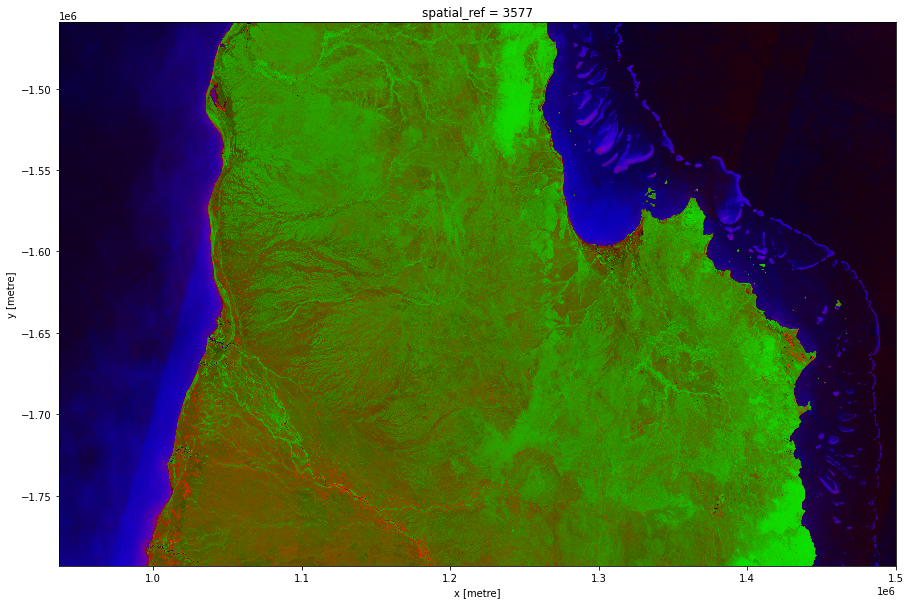

In [29]:
plot_image(apply_ows_style_cfg(r_ndvi_ndwi_halfrange_cfg, data))

In [34]:
ndvi_bidirection_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "mpl_ramp": "ocean_r",
    "range": [0.0, 1.0]
}

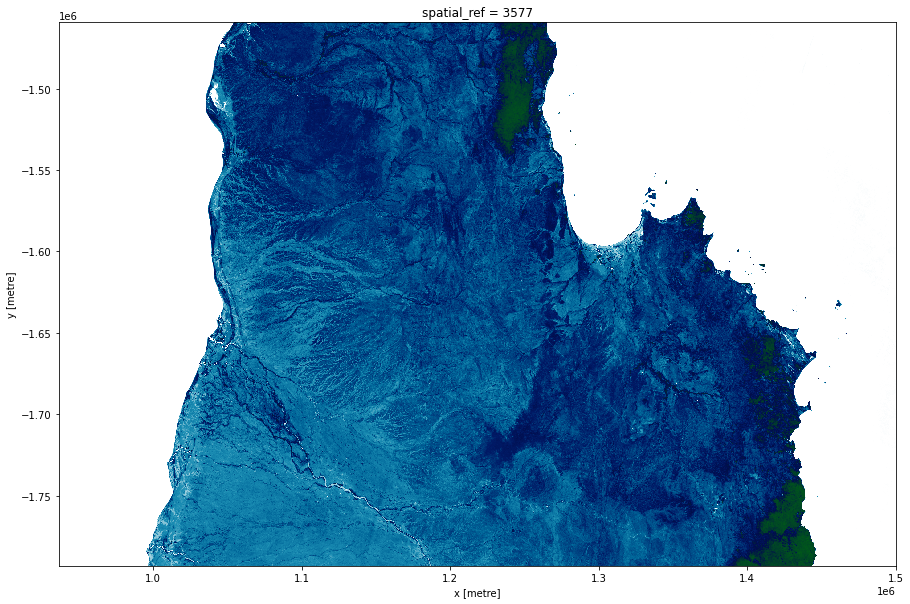

In [35]:
plot_image(apply_ows_style_cfg(ndvi_bidirection_cfg, data))


In [36]:
ndvi_custom_ramp_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "color_ramp": [
        {"value": -1.0, "color": "#0000FF"},
        {"value": -0.2, "color": "#005050",},
        {"value": -0.1, "color": "#505050",},
        {"value": -0.01, "color": "#303030",},
        {"value": 0.0, "color": "black",},
        {"value": 0.01, "color": "#303000",},
        {"value": 0.5, "color": "#707030",},
        {"value": 1.0, "color": "#FF9090",},
    ]
}

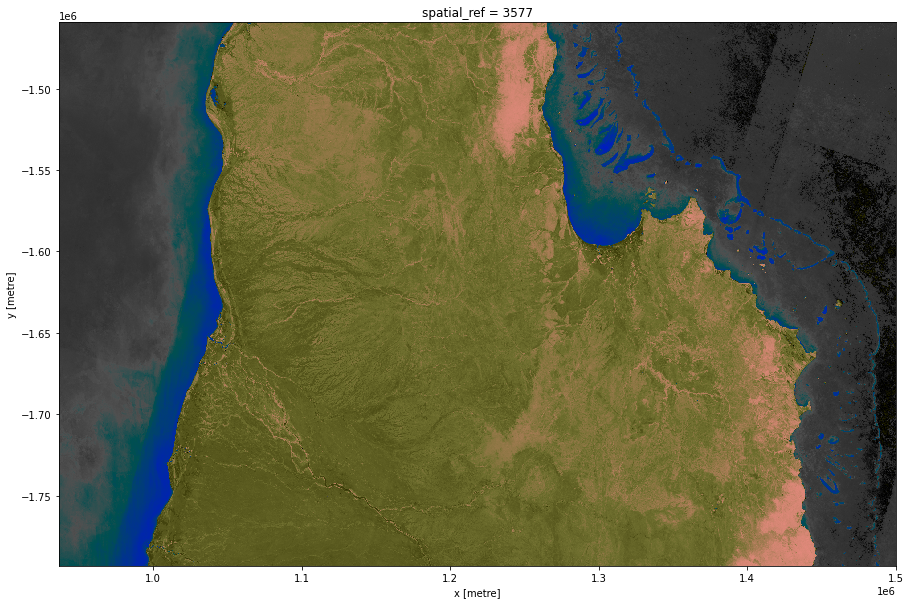

In [37]:
plot_image(apply_ows_style_cfg(ndvi_custom_ramp_cfg, data))

In [38]:
ndvi_custom_ramp_alpha_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "color_ramp": [
        # For NDVI -1.0 to 0.0, the image is fully transparent.

        {
            "value": -1.0,
            "color": "#000000",
            "alpha": 0.0,
        },
        {
            "value": 0.0,
            "color": "#000000",
            "alpha": 0.0,
        },

        # For NDVI 0.0 to 0.1, the transparency gradually reduces to zero and colour
        # fades from black to dark blue.

        {
            "value": 0.1,
            "color": "#000030",
            "alpha": 1.0,
        },

        # For NDVI 0.1 to 0.3 colour brightens from dark blue to a dark purple

        {
            "value": 0.3,
            "color": "#703070",
        },

        # For NDVI 0.3 to 0.6 colour brightens from purple to yellow.

        {
            "value": 0.6,
            "color": "#e0e070",
        },

        # For NDVI 0.6 to 1.0 colour brightens from yellow to bright green.

        {
            "value": 1.0,
            "color": "#90FF90",
        }
    ]
}

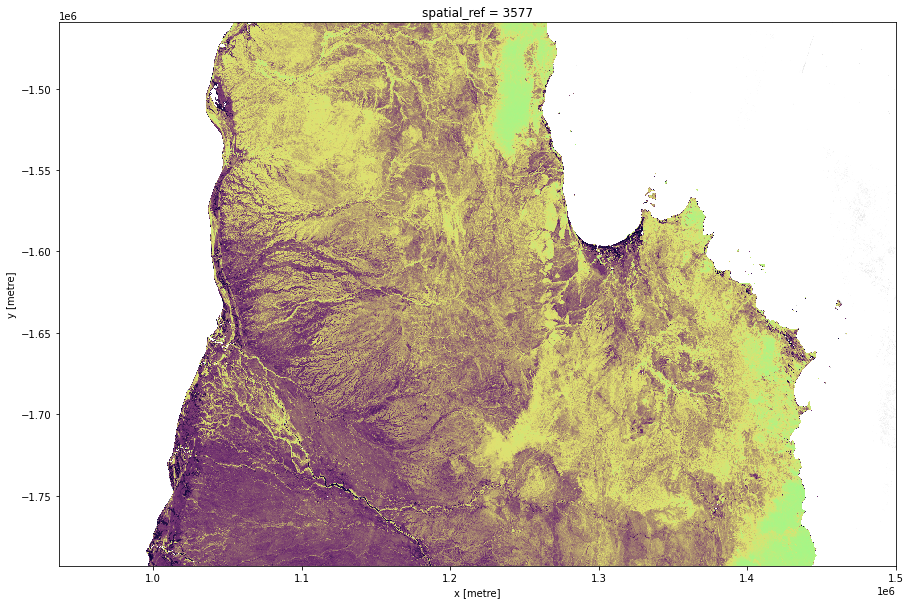

In [39]:
plot_image(apply_ows_style_cfg(ndvi_custom_ramp_alpha_cfg,  data))

In [40]:
ndvi_custom_ramp_cfg = {
    "index_expression": "(nir-red)/(nir+red)",
    "color_ramp": [
        {"value": -1.0, "color": "#0000FF"},
        {"value": -0.2, "color": "#005050",},
        {"value": -0.1, "color": "#505050",},
        {"value": -0.01, "color": "#303030",},
        {"value": 0.0, "color": "black",},
        {"value": 0.01, "color": "#303000",},
        {"value": 0.5, "color": "#707030",},
        {"value": 1.0, "color": "#FF9090",},
    ]
}

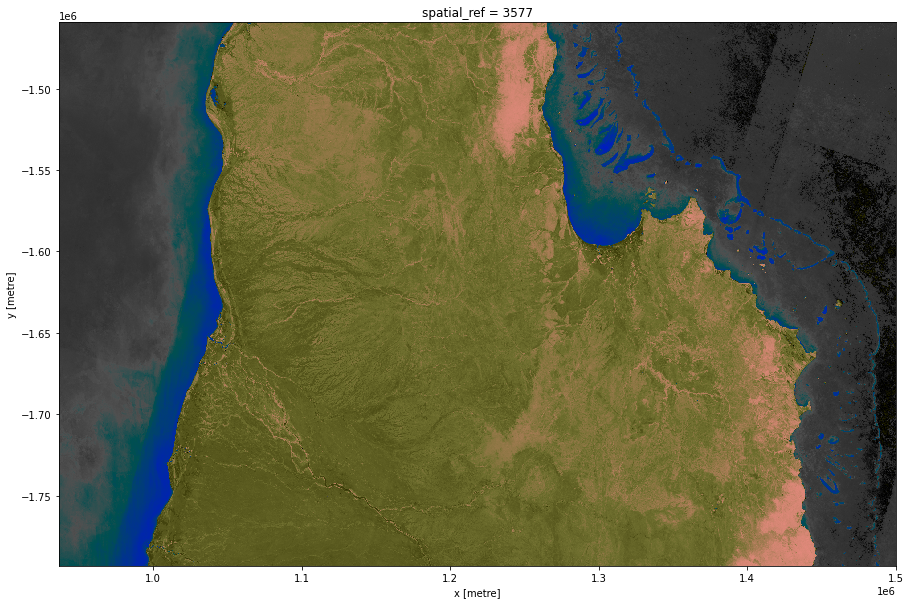

In [41]:
plot_image(apply_ows_style_cfg(ndvi_custom_ramp_cfg, data))


In [42]:

disc_data = dc.load(
    product='ga_ls_wo_3',
    measurements=['water'],
    latitude=(-15.9098, -15.0496),
    longitude=(128.0882, 129.2171),
    time=('2020-12-24T10:00:00', '2020-12-25T09:59:59'),
    output_crs="EPSG:3577",
    resolution=(-120,120),
    group_by="solar_day"
)

In [43]:
disc_data

<xarray.Dataset>
Dimensions:      (time: 1, x: 1038, y: 815)
Coordinates:
  * time         (time) datetime64[ns] 2020-12-25T01:30:05.471325
  * y            (y) float64 -1.6e+06 -1.6e+06 ... -1.698e+06 -1.698e+06
  * x            (x) float64 -4.241e+05 -4.24e+05 ... -2.998e+05 -2.997e+05
    spatial_ref  int32 3577
Data variables:
    water        (time, y, x) uint8 0 0 0 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1 1 1 1
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

In [48]:
disc_data["water"].attrs

{'units': '1',
 'nodata': 1,
 'flags_definition': {'dry': {'bits': [7, 6, 5, 4, 3, 2, 1, 0],
   'values': {'0': True},
   'description': 'No water detected'},
  'wet': {'bits': [7, 6, 5, 4, 3, 2, 1, 0],
   'values': {'128': True},
   'description': 'Clear and Wet'},
  'cloud': {'bits': 6,
   'values': {'0': False, '1': True},
   'description': 'Cloudy'},
  'nodata': {'bits': 0,
   'values': {'0': False, '1': True},
   'description': 'No data'},
  'high_slope': {'bits': 4,
   'values': {'0': False, '1': True},
   'description': 'High slope'},
  'cloud_shadow': {'bits': 5,
   'values': {'0': False, '1': True},
   'description': 'Cloud shadow'},
  'noncontiguous': {'bits': 1,
   'values': {'0': False, '1': True},
   'description': 'At least one EO band is missing or saturated'},
  'terrain_shadow': {'bits': 3,
   'values': {'0': False, '1': True},
   'description': 'Terrain shadow'},
  'low_solar_angle': {'bits': 2,
   'values': {'0': False, '1': True},
   'description': 'Low solar incide

In [54]:
simple_map_cfg = {
    "value_map": {
        # Value_map maps a band to a list of rules.
        # Do not put multiple bands with independent rules into a single value_map. It
        # may appear to work, but in practice you cannot guarantee which band will be checked
        # for matches first, and therefore the output may render inconsistently from one python
        # instance to another.
        "water": [
            {
                "title": "Cloud",
                "abstract": "",
                "flags": {"cloud": True},
                "color": "Beige",
            },
            {
                "title": "Terrain",
                "abstract": "",
                # Flag rules can contain an "or" - they match if either of the conditions hold.
                "flags": {"or": {"terrain_shadow": True, "high_slope": True}},
                "color": "SlateGray",
            },
            {
                "title": "Cloud Shadow and High Slope",
                "abstract": "",
                # Flag rules can contain an "and" - they match if all of the conditions hold.
                "flags": {"and": {"cloud_shadow": True, "high_slope": True}},
                "color": "DarkKhaki",
            },
        ]
    }
}

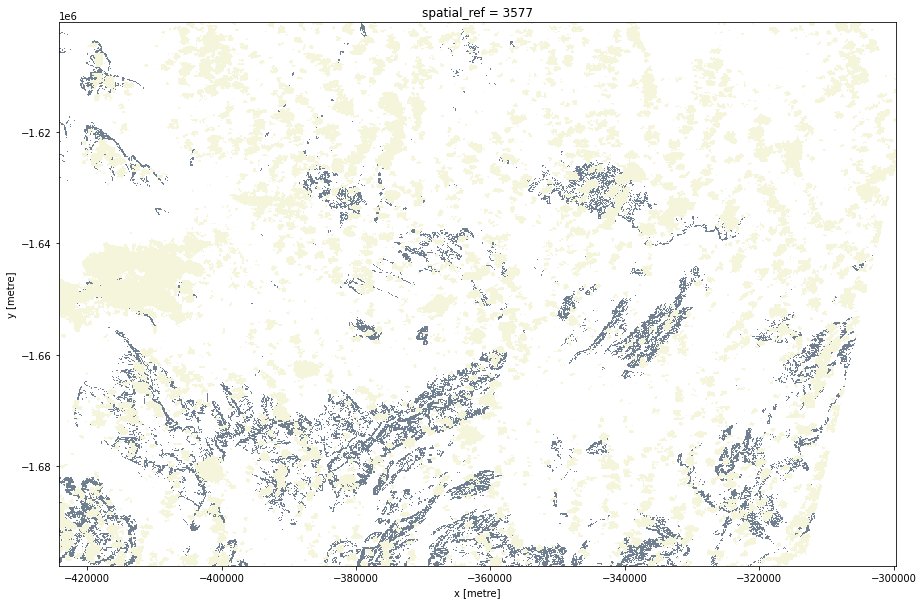

In [55]:
plot_image(apply_ows_style_cfg(simple_map_cfg, disc_data))

In [56]:
import xarray as xr
from datacube import Datacube
dc = Datacube()

wofs_data = dc.load(
    product='ga_ls_wo_3',
    measurements=['water'],
    latitude=(-15.9098, -15.0496),
    longitude=(128.0882, 129.2171),
    time=('2020-12-08T10:00:00', '2020-12-09T09:59:59'),
    output_crs="EPSG:3577",
    resolution=(-120,120),
    group_by="solar_day"
)

fc_data = dc.load(
    product='ga_ls_fc_3',
    measurements=['bs', 'pv', 'npv'],
    latitude=(-15.9098, -15.0496),
    longitude=(128.0882, 129.2171),
    time=('2020-12-08T10:00:00', '2020-12-09T09:59:59'),
    output_crs="EPSG:3577",
    resolution=(-120,120),
    group_by="solar_day"
)

# Time coordinates come back slightly differently from the two products, so we need
# to align them before we combine.

wofs_data.coords["time"] = fc_data.coords["time"]
combined_data = xr.combine_by_coords(
        [fc_data, wofs_data],
        join="exact")

/home/jovyan/.envs/odc/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [58]:
unmasked_fc_cfg =  {
    "components": {
        "red": {"bs": 1.0},
        "green": {"pv": 1.0},
        "blue": {"npv": 1.0}},
    "scale_range": [0.0, 100.0],
    }

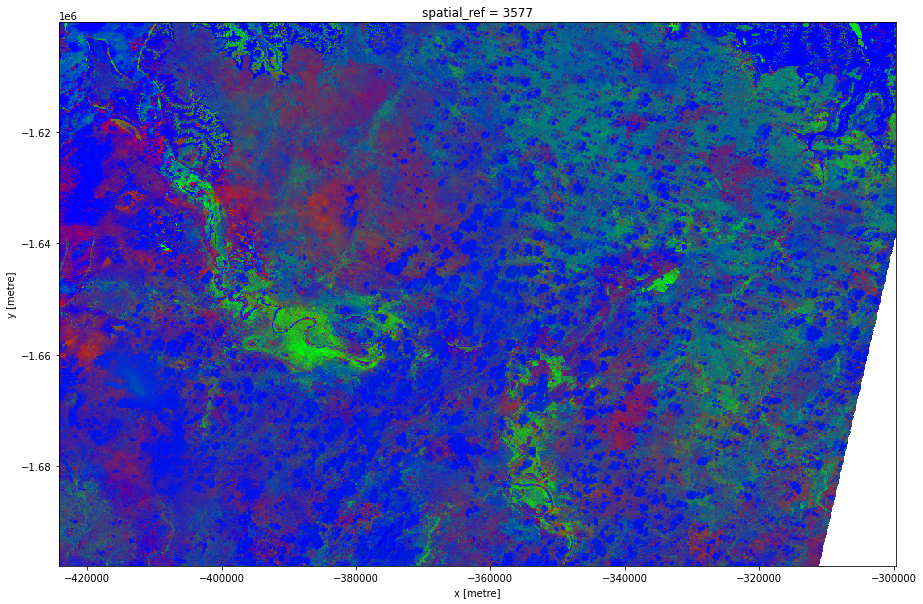

In [59]:
plot_image(apply_ows_style_cfg(unmasked_fc_cfg, combined_data))

In [62]:
masked_fc_cfg =  {
    "components": {
        "red": {"bs": 1.0},
        "green": {"pv": 1.0},
        "blue": {"npv": 1.0}},
    "scale_range": [0.0, 100.0],
    "pq_masks": [
        # Pixels must match all flags to remain visible.
        {
            "band": "water",
            "flags": {
                "nodata": False,
                "noncontiguous": False,
                "terrain_shadow": False,
                "low_solar_angle": False,
                "high_slope": False,
                "cloud_shadow": False,
                "cloud": False,
            }
        }
    ]
}

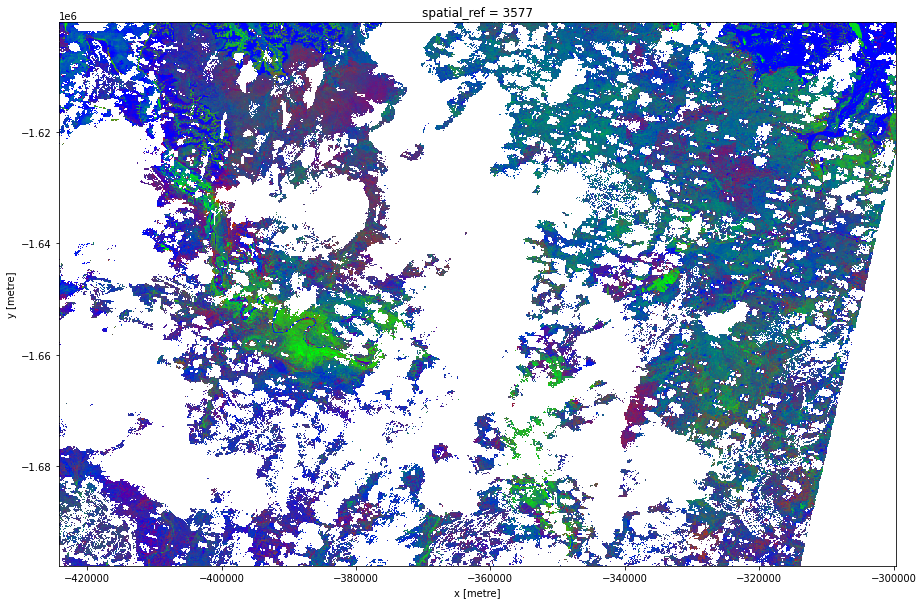

In [63]:
plot_image(apply_ows_style_cfg(masked_fc_cfg, combined_data))

In [67]:
enum_masked_fc_cfg =  {
    "components": {
        "red": {"bs": 1.0},
        "green": {"pv": 1.0},
        "blue": {"npv": 1.0}
    },
    "scale_range": [0.0, 100.0],
    "pq_masks": [
        {
            "band": "water",
            "enum": 1, # 1 = nodata
            "invert": True,
        }
    ]
}

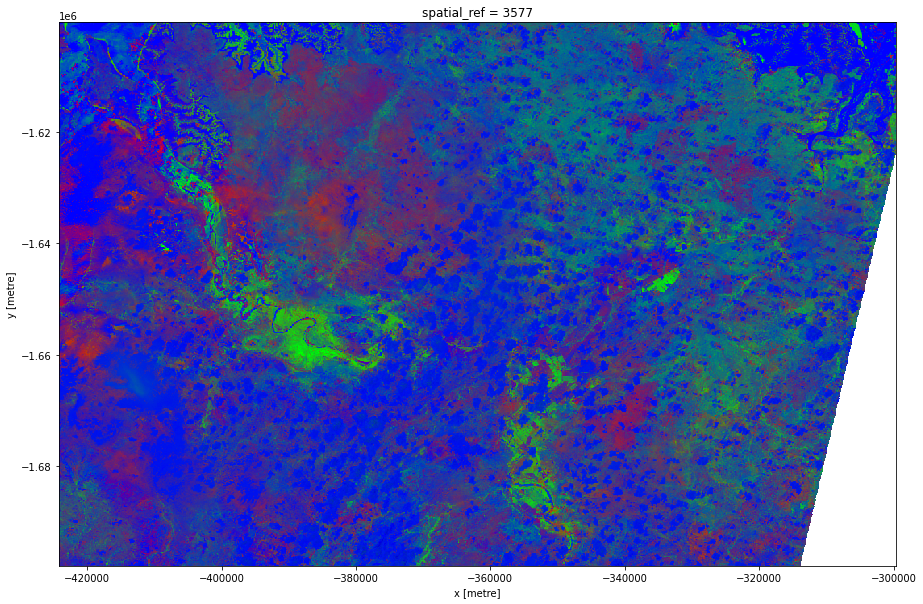

In [68]:
plot_image(apply_ows_style_cfg(enum_masked_fc_cfg, combined_data))

In [69]:
rgb_ndvi_transparency_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
        "alpha": {
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "nir",
                "band2": "red",
                "scale_from": (0.0, 0.5),
                "scale_to": (0, 255)
            }
        },
    },
    "scale_range": (50, 3000),
}

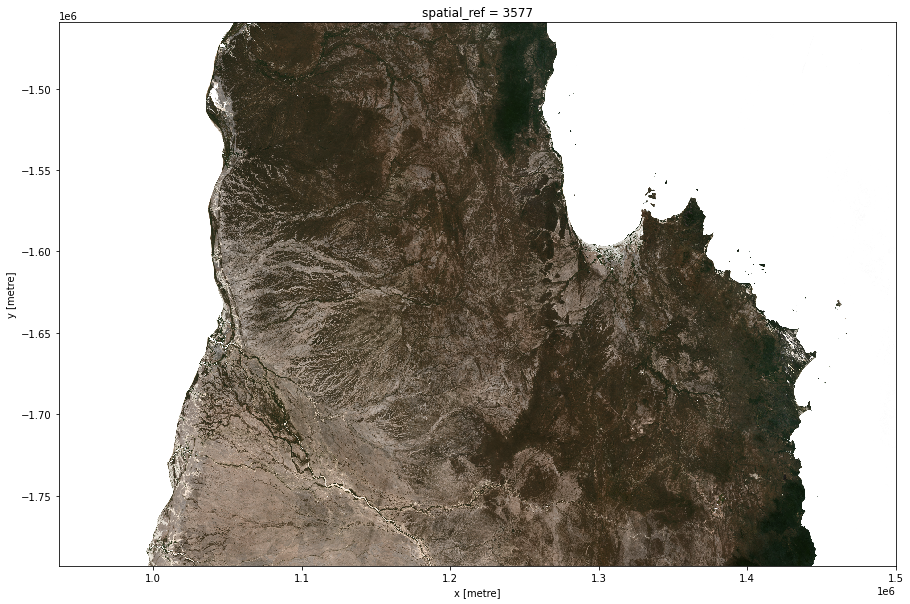

In [70]:
plot_image(apply_ows_style_cfg(rgb_ndvi_transparency_cfg, data))